图像上作图

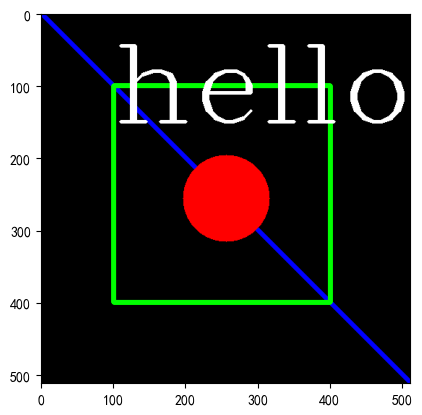

In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

# 设置字体为 SimHei（黑体），它支持中文字符
plt.rcParams['font.sans-serif'] = ['SimHei'] 

# 解决负号 '-' 显示为方块的问题
plt.rcParams['axes.unicode_minus'] = False


img = np.zeros((512, 512, 3), np.uint8)

cv.line(img, (0, 0), (512, 512), (255, 0, 0), 5)
cv.circle(img, (256, 256), 60, (0, 0, 255), -1)
cv.rectangle(img, (100, 100), (400, 400), (0, 255, 0), 5)
cv.putText(img, 'hello', (100, 150), cv.FONT_HERSHEY_COMPLEX, 5, (255, 255, 255), 3)

plt.imshow(img[:, :, ::-1])
plt.show()

图像基础处理

In [2]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt 

In [3]:
img = np.zeros((256, 256, 3), np.uint8)

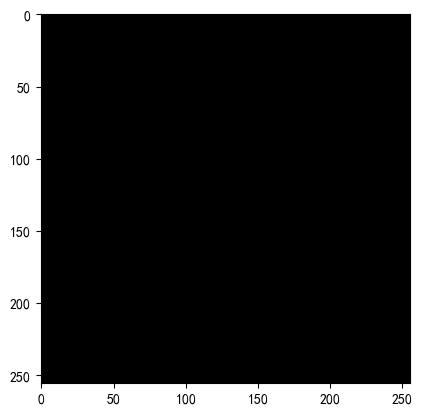

In [4]:
plt.imshow(img[:, :, ::-1])

In [5]:
img[100, 100]

array([0, 0, 0], dtype=uint8)

In [6]:
img[100, 100, 0]

0

In [7]:
img[100, 100] = (0, 0, 255)

array([  0,   0, 255], dtype=uint8)

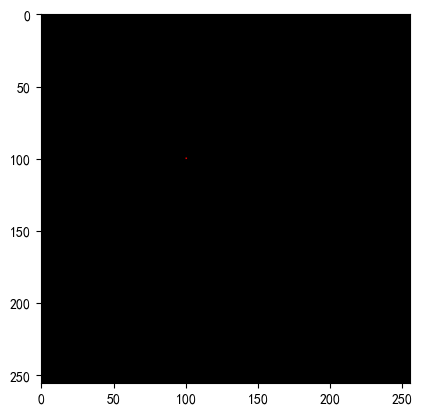

In [8]:
plt.imshow(img[:, :, ::-1])
img[100, 100]

In [9]:
img.shape

(256, 256, 3)

In [10]:
img.dtype

dtype('uint8')

In [11]:
img.size

196608

In [12]:
b, g, r = cv.split(img)
img1 = cv.merge((b, g, r))

In [13]:
# 读取图像
lena = cv.imread('D:/learnopencv/pythonProject1/0013035.jpg',1)


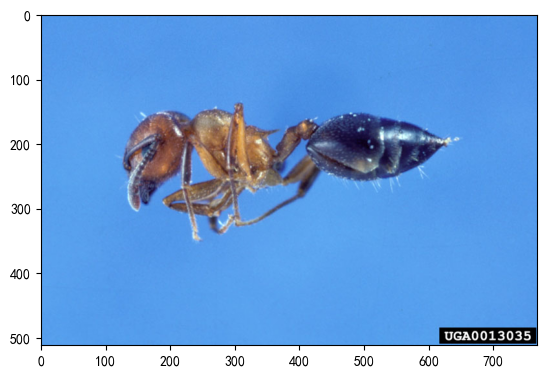

In [14]:
plt.imshow(lena[:, :, ::-1])

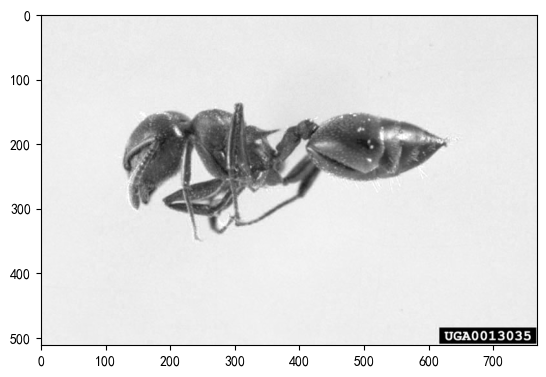

In [15]:
b, g, r = cv.split(lena)
plt.imshow(b, cmap=plt.cm.gray)

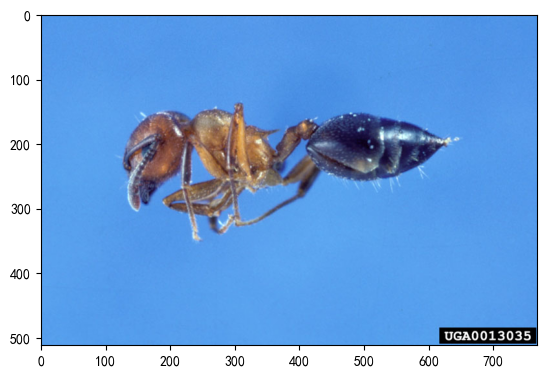

In [16]:
img2 = cv.merge((b, g, r))
plt.imshow(img2[:, :, ::-1])

In [17]:
gray = cv.cvtColor(lena, cv.COLOR_BGR2GRAY)

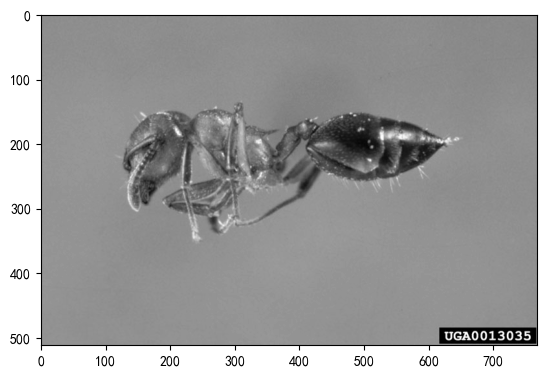

In [18]:
plt.imshow(gray, cmap=plt.cm.gray)

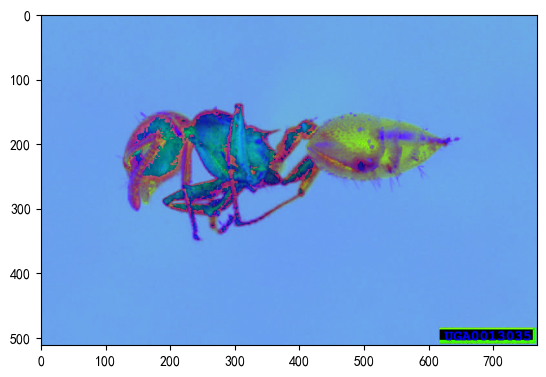

In [19]:
hsv = cv.cvtColor(lena, cv.COLOR_BGR2HSV)
plt.imshow(hsv)

In [20]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

int1 = cv.imread('int1.jpg')
int2 = cv.imread('int2.jpg')

In [21]:
int3 = cv.add(int1, int2)
int4 = int1 + int2

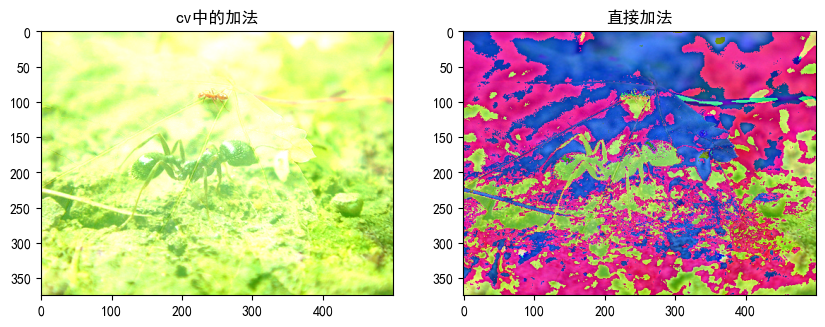

In [22]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 8), dpi=100)
axes[0].imshow(int3[:, :, ::-1])
axes[0].set_title('cv中的加法')
axes[1].imshow(int4[:, :, ::-1])
axes[1].set_title('直接加法')
plt.show()

图像的算数运算

In [23]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

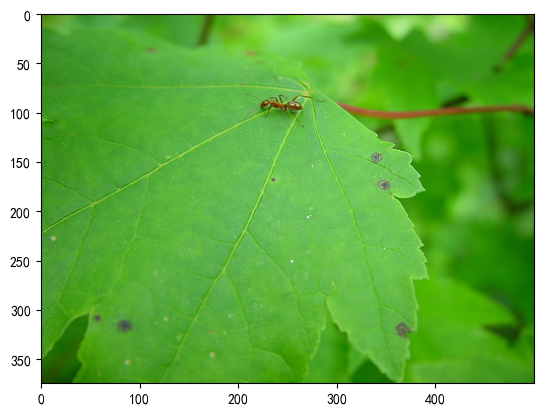

In [24]:
int1 = cv.imread('int1.jpg')
plt.imshow(int1[:, :, ::-1])

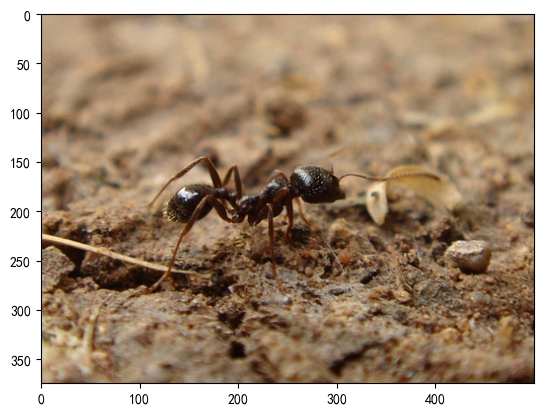

In [25]:
int2 = cv.imread('int2.jpg')
plt.imshow(int2[:, :, ::-1])

In [26]:
img = int1 + int2
img1 = cv.add(int1, int2)

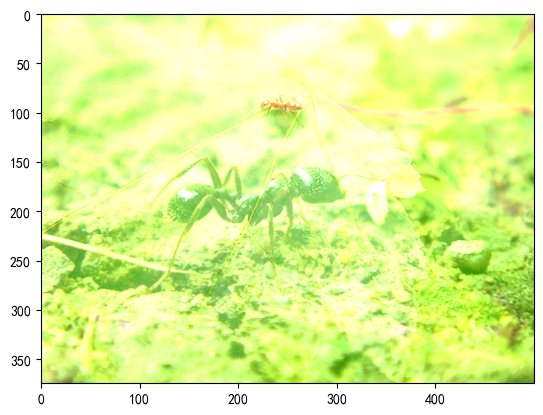

In [27]:
plt.imshow(img1[:, :, ::-1])

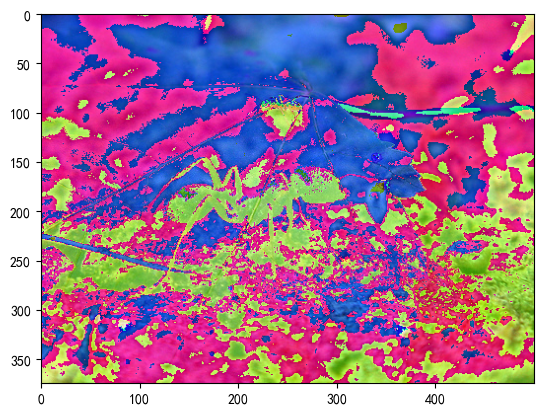

In [28]:
plt.imshow(img[:, :, ::-1])

In [29]:
img2 = cv.addWeighted(int1, 0.7, int2, 0.3, 0)

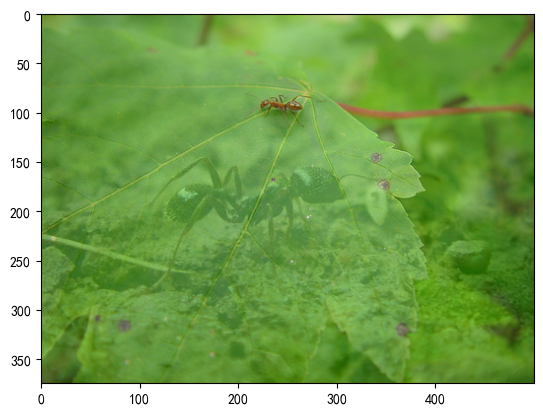

In [30]:
plt.imshow(img2[:, :, ::-1])

几何变换

In [31]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

In [32]:
int = cv.imread('int3.jpg')

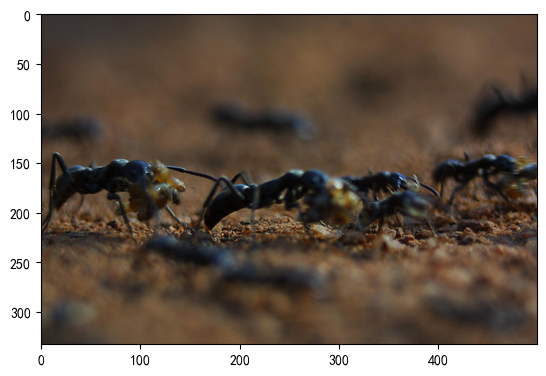

In [33]:
plt.imshow(int[:, :, ::-1])

#绝对尺寸

In [34]:
rows, cols = int.shape[:2]

In [35]:
rows

333

In [36]:
cols

500

In [37]:
res = cv.resize(int, (2*cols, 2*rows))

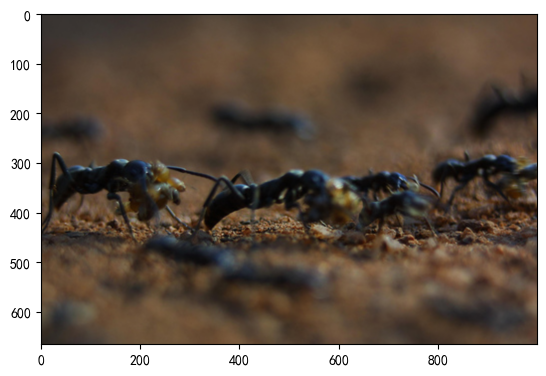

In [38]:
plt.imshow(res[:, :, ::-1])

In [39]:
res.shape

(666, 1000, 3)

In [40]:
res1 = cv.resize(int, None, fx=0.5, fy=0.5)

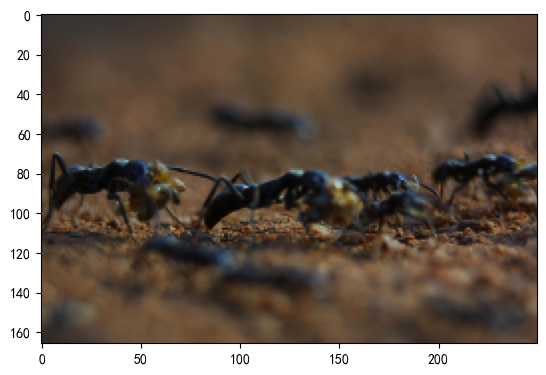

In [41]:
plt.imshow(res1[:, :, ::-1])

In [42]:
res1.shape

(166, 250, 3)

图像的平移

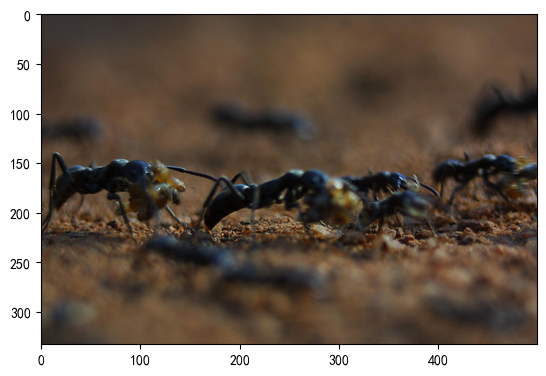

In [43]:
plt.imshow(int[:, :, ::-1])

In [44]:
rows

333

In [45]:
cols

500

In [46]:
M = np.float32([[1, 0, 100], [0, 1, 50]])

In [47]:
res2 = cv.warpAffine(int, M, (cols, rows))

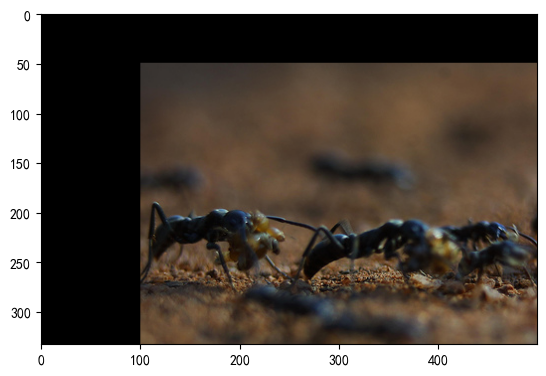

In [48]:
plt.imshow(res2[:, :, ::-1])

图像旋转

In [49]:
M = cv.getRotationMatrix2D((cols/2, rows/2), -45, 0.5)

In [50]:
res3 = cv.warpAffine(int, M, (cols, rows))

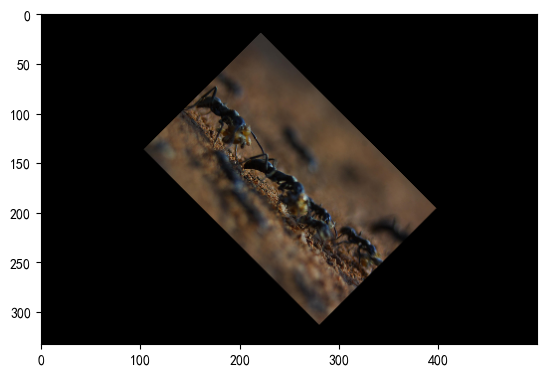

In [51]:
plt.imshow(res3[:, :, ::-1])

仿射变换

In [52]:
pts1 = np.float32([[50, 50], [200, 50], [50, 200]])
pts2 = np.float32([[100, 100], [200, 50], [100, 250]])

In [53]:
M = cv.getAffineTransform(pts1, pts2)

In [54]:
M

array([[ 0.66666667,  0.        , 66.66666667],
       [-0.33333333,  1.        , 66.66666667]])

In [55]:
res4 = cv.warpAffine(int, M, (cols, rows))

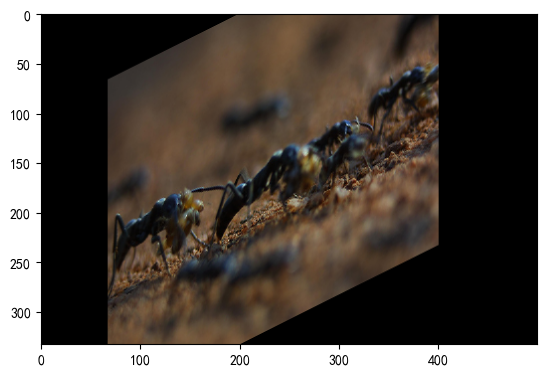

In [56]:
plt.imshow(res4[:, :, ::-1])

透射变换

In [57]:
pst1 = np.float32([[56, 65], [368, 52], [28, 387], [389, 390]])
pst2 = np.float32([[100, 145], [300, 100], [80, 290], [310, 300]])

In [58]:
T = cv.getPerspectiveTransform(pst1, pst2)

In [59]:
T

array([[ 3.98327670e-01, -2.09876559e-02,  7.49460064e+01],
       [-1.92233080e-01,  4.29335771e-01,  1.21896057e+02],
       [-7.18774228e-04, -1.33393850e-05,  1.00000000e+00]])

In [60]:
res5 = cv.warpPerspective(int, T, (cols, rows))

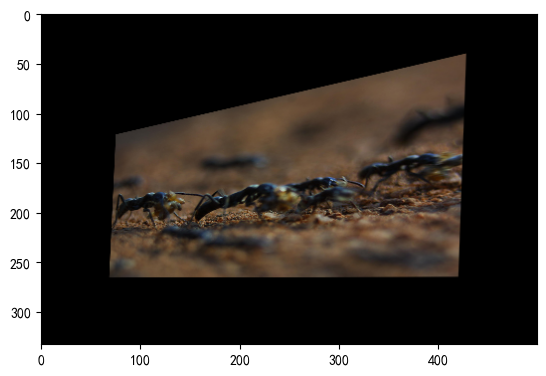

In [61]:
plt.imshow(res5[:, :, ::-1])

6图像金字塔

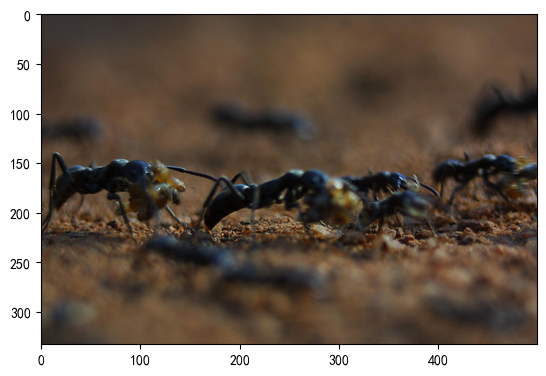

In [62]:
plt.imshow(int[:, :, ::-1])

In [63]:
imgup = cv.pyrUp(int)

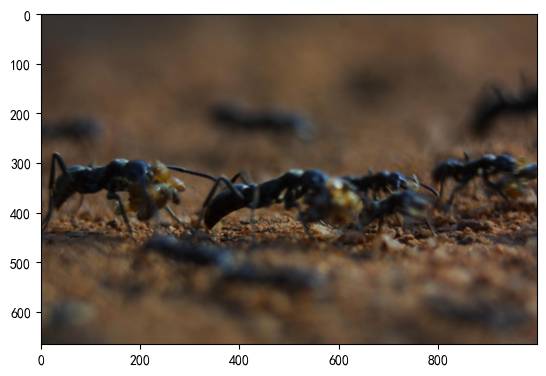

In [64]:
plt.imshow(imgup[:, :, ::-1])

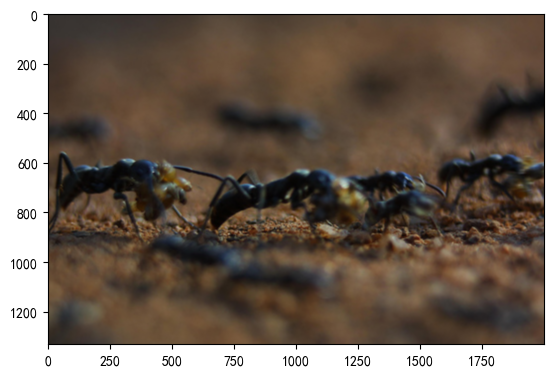

In [65]:
imgup1 = cv.pyrUp(imgup)
plt.imshow(imgup1[:, :, ::-1])

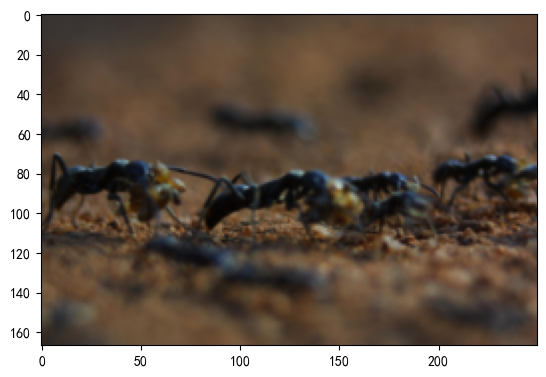

In [66]:
imgdown = cv.pyrDown(int)
plt.imshow(imgdown[:, :, ::-1])

形态学操作

In [67]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

腐蚀与膨胀

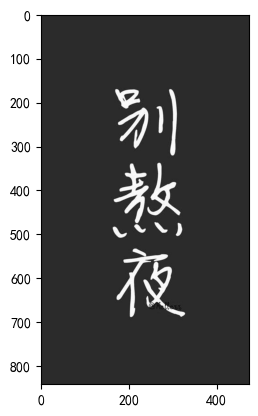

In [68]:
img = cv.imread('word.jpg')
plt.imshow(img[:, :, ::-1])

In [69]:
#创建核结构
kenel = np.ones((5, 5), np.uint8)

In [70]:
#腐蚀
img2 = cv.erode(img, kenel)

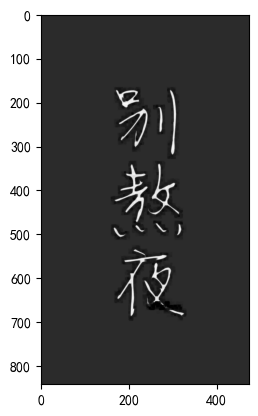

In [71]:
plt.imshow(img2[:, :, ::-1])

In [72]:
#膨胀
img1 = cv.dilate(img, kenel)

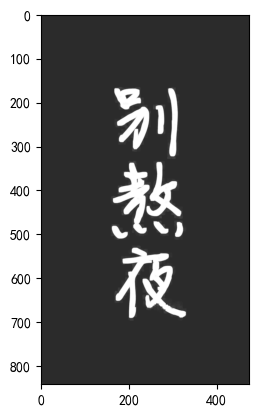

In [73]:
plt.imshow(img1[:, :, ::-1])

开闭运算

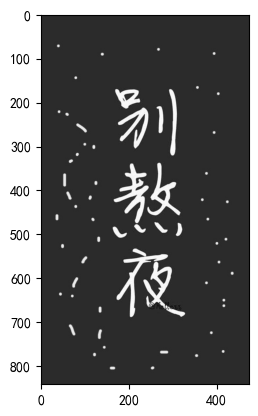

In [74]:
open = cv.imread('word1.jpg')
plt.imshow(open[:, :, ::-1])

In [75]:
kenel = np.ones((7, 7), np.uint8)
cvopen = cv.morphologyEx(open, cv.MORPH_OPEN, kenel)

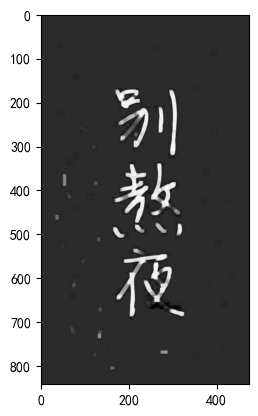

In [76]:
plt.imshow(cvopen[:, :, ::-1])

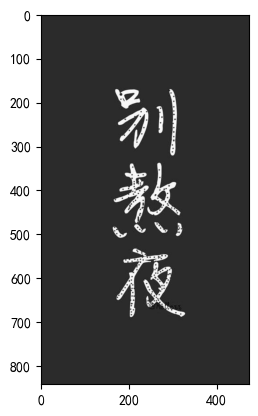

In [77]:
close = cv.imread('word2.jpg')
plt.imshow(close[:, :, ::-1])

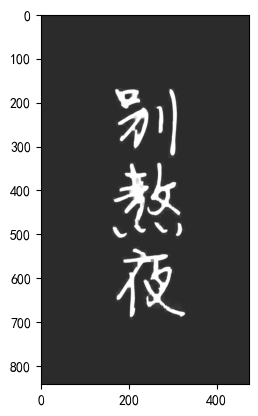

In [78]:
cvclose = cv.morphologyEx(close, cv.MORPH_CLOSE, kenel)
plt.imshow(cvclose[:, :, ::-1])

礼帽和黑帽

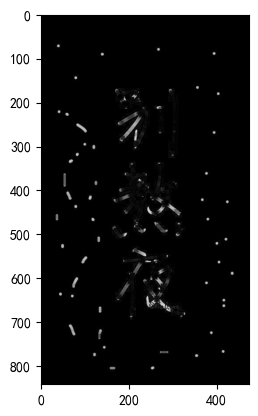

In [79]:
top = cv.morphologyEx(open, cv.MORPH_TOPHAT, kenel)
plt.imshow(top)

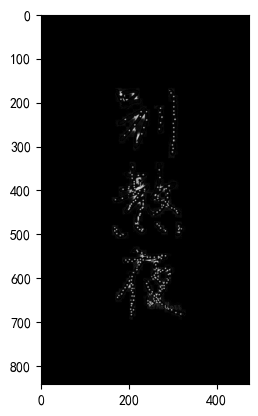

In [80]:
black = cv.morphologyEx(close, cv.MORPH_BLACKHAT, kenel)
plt.imshow(black)

图像平滑

In [81]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv

均值滤波

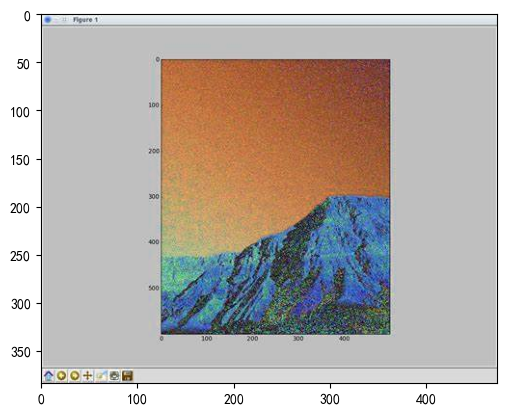

In [82]:
ikunsp = cv.imread('ikun.jpg')
sceneau = cv.imread('scene.jpg')
plt.imshow(sceneau)

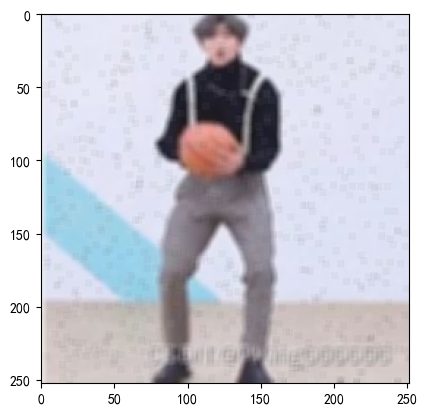

In [83]:
ikun = cv.blur(ikunsp, (5, 5))
plt.imshow(ikun[:, :, ::-1])

In [84]:
scene = cv.GaussianBlur(sceneau, (3, 3), 1)

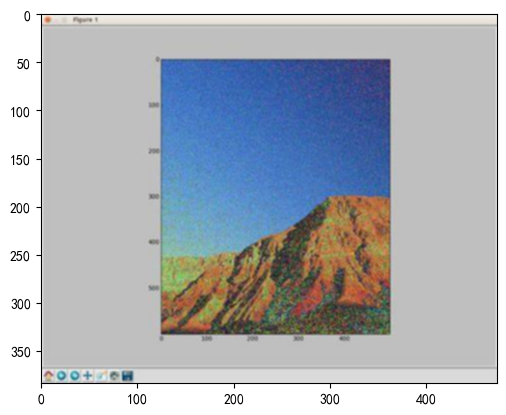

In [85]:
plt.imshow(scene[:, :, ::-1])

中值滤波

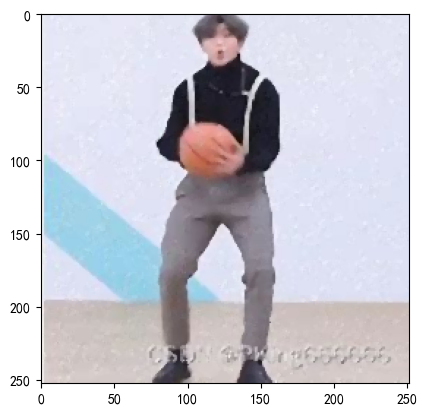

In [86]:
ikun = cv.medianBlur(ikunsp, 3)
plt.imshow(ikun[:, :, ::-1])

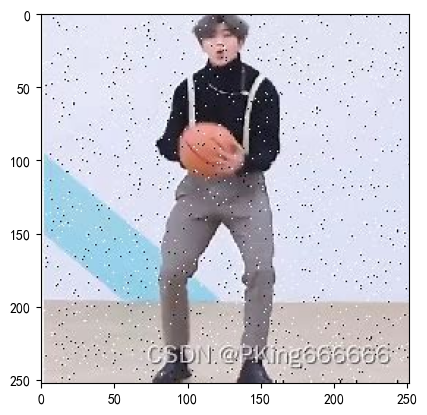

In [87]:
plt.imshow(ikunsp[:, :, ::-1])

In [88]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

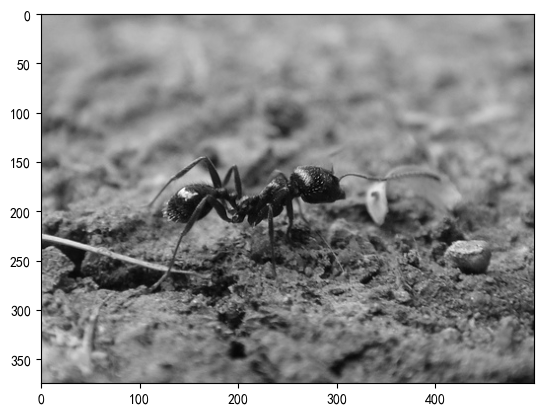

In [89]:
img = cv.imread('int2.jpg', 0)
plt.imshow(img, cmap=plt.cm.gray)

直方图

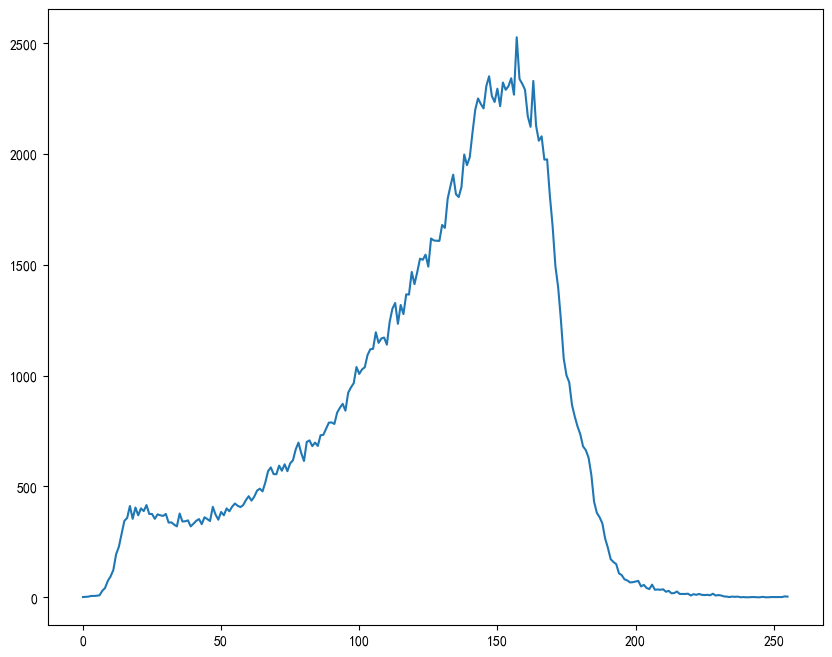

In [90]:
hist = cv.calcHist([img], [0], None, [256], [0, 256])

plt.figure(figsize=(10, 8))
plt.plot(hist)
plt.show()

掩膜的应用

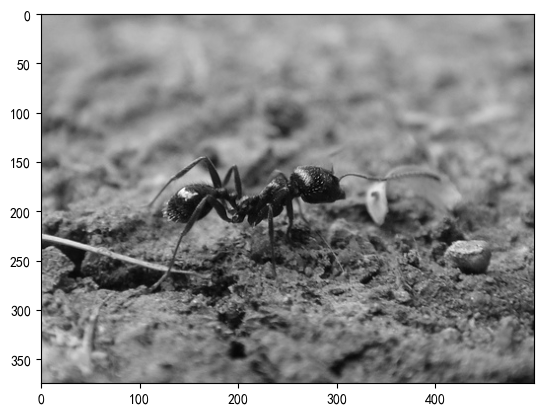

In [91]:
plt.imshow(img, cmap=plt.cm.gray)

In [92]:
img.shape[:2]

(375, 500)

In [93]:
#创建掩膜
mask = np.zeros(img.shape[:2], np.uint8)
mask[100:280, 100:350] = 1

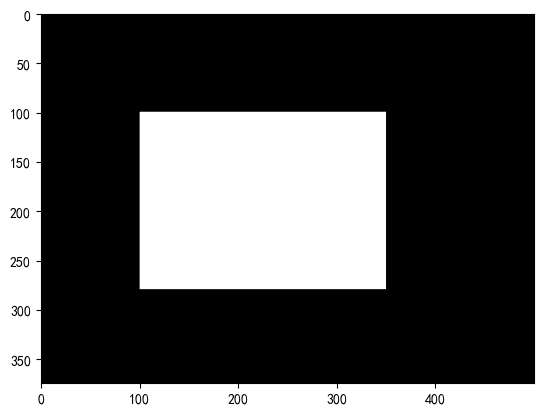

In [94]:
plt.imshow(mask, cmap=plt.cm.gray)

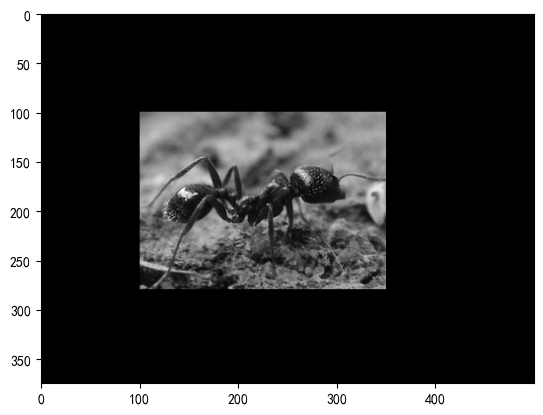

In [95]:
mask_img = cv.bitwise_and(img, img, mask=mask)

plt.imshow(mask_img, cmap=plt.cm.gray)

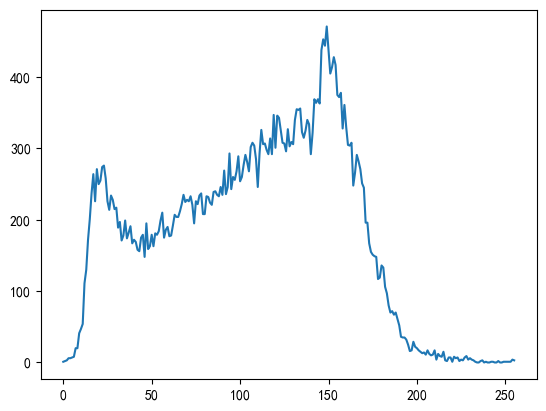

In [96]:
mask_hist = cv.calcHist([img], [0], mask, [256], [0, 256])
plt.plot(mask_hist)
plt.show()

直方图均衡化

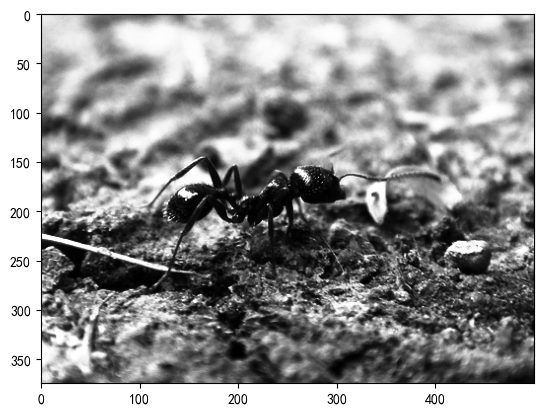

In [97]:
dst = cv.equalizeHist(img)
plt.imshow(dst, cmap=plt.cm.gray)

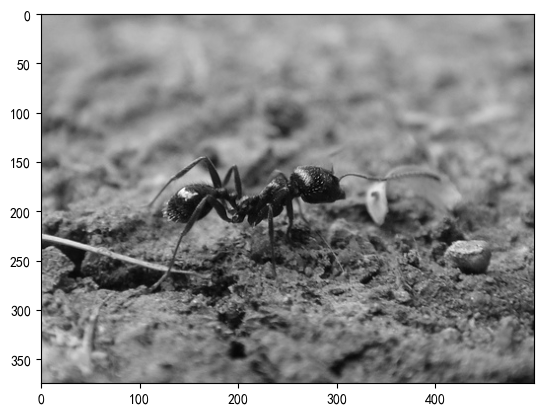

In [98]:
plt.imshow(img, cmap=plt.cm.gray)

自适应均衡化

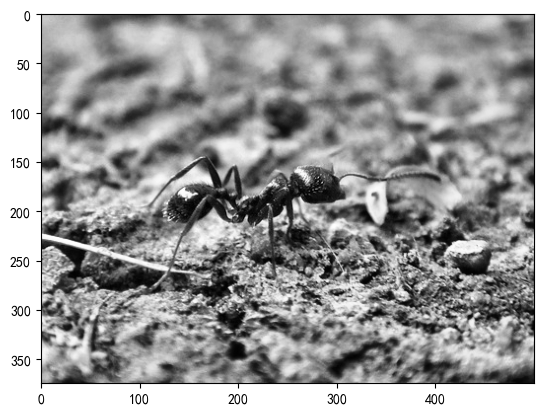

In [99]:
cl = cv.createCLAHE(2.0, (8, 8))
clahe = cl.apply(img)
plt.imshow(clahe, cmap=plt.cm.gray)

边缘检测

In [100]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

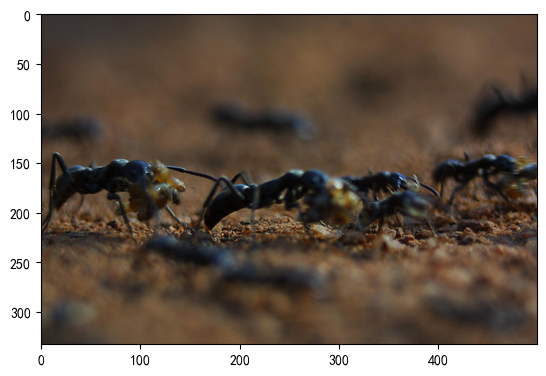

In [101]:
img = cv.imread('int3.jpg')
plt.imshow(img[:, :, ::-1])

In [102]:
x = cv.Sobel(img, cv.CV_16S, 1, 0)
y = cv.Sobel(img, cv.CV_16S, 0, 1)

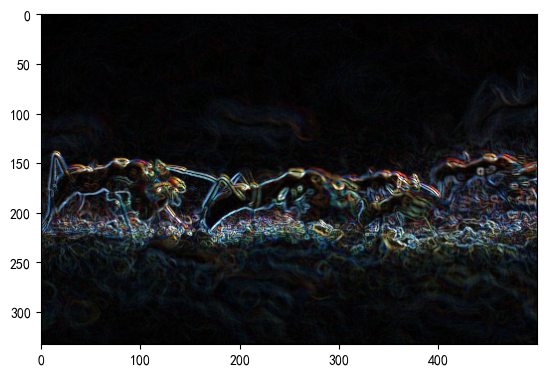

In [103]:
absx = cv.convertScaleAbs(x)
absy = cv.convertScaleAbs(y)

res = cv.addWeighted(absx, 0.5, absy, 0.5, 0)
plt.imshow(res, cmap=plt.cm.gray)

Scharr

In [104]:
x = cv.Sobel(img, cv.CV_16S, 1, 0, ksize=-1)
y = cv.Sobel(img, cv.CV_16S, 0, 1, ksize=-1)

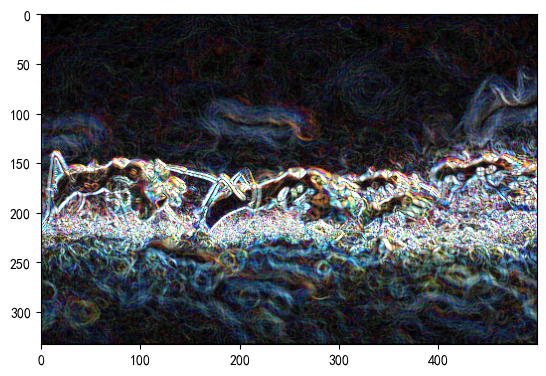

In [105]:
absx = cv.convertScaleAbs(x)
absy = cv.convertScaleAbs(y)

res = cv.addWeighted(absx, 0.5, absy, 0.5, 0)
plt.imshow(res, cmap=plt.cm.gray)

Laplacia

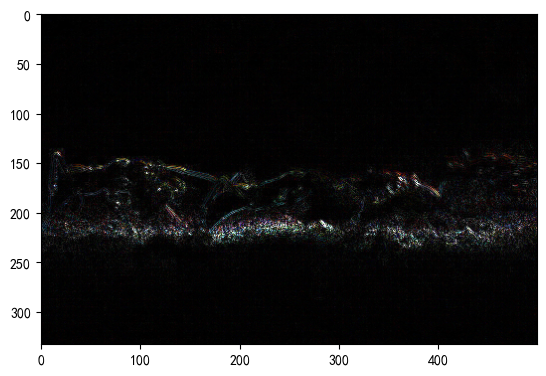

In [106]:
res = cv.Laplacian(img, cv.CV_16S)
res = cv.convertScaleAbs(res)
plt.imshow(res, cmap=plt.cm.gray)

canny

In [107]:
res = cv.

SyntaxError: invalid syntax (678312981.py, line 1)